In [40]:
import torch
import torchvision
import torch.nn as nn
import torchvision.transforms as transforms
import numpy as np
import torch.utils.data as data
import matplotlib.pyplot as plt
import torchvision.utils as vutils

In [41]:
torch.cuda.set_device(0)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

device

device(type='cuda')

In [42]:
image_size = 64

means = torch.Tensor((0.5, 0.5, 0.5))
stds = torch.Tensor((0.5, 0.5, 0.5))
norm = (means, stds)

train_transform_standard = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Resize(image_size),
     transforms.CenterCrop(image_size),
     transforms.Normalize(*norm, inplace=True)])

train_dataset = torchvision.datasets.ImageFolder("train_dataset", transform=train_transform_standard)

train_loader = data.DataLoader(train_dataset, batch_size=256, shuffle=True, num_workers=2)

unnormalize = transforms.Normalize((-1*means / stds).tolist(), (1.0 / stds).tolist())

In [43]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.n = 32
        self.main = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=self.n, stride =(2, 2), kernel_size=(4, 4), bias=False, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=self.n, out_channels=self.n * 2, stride =(2, 2), kernel_size=(4, 4), bias=False, padding=1),
            nn.BatchNorm2d(self.n * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=self.n * 2, out_channels=self.n * 4, stride =(2, 2), kernel_size=(4, 4), bias=False, padding=1),
            nn.BatchNorm2d(self.n * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=self.n * 4, out_channels=self.n * 8, stride =(2, 2), kernel_size=(4, 4), bias=False, padding=1),
            nn.BatchNorm2d(self.n * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(in_channels=self.n * 8, out_channels=1, kernel_size=(4, 4), bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [44]:
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.latent_dim = latent_dim
        self.n = 512
        self.main = nn.Sequential(
            # Batch_size x n x kernel_size x kernel_size -> Batch_size x n x 4 x 4
            nn.ConvTranspose2d(in_channels=latent_dim, out_channels=self.n, kernel_size=(4, 4), bias=False),
            nn.BatchNorm2d(self.n),
            nn.ReLU(True),

            # Batch_size x n x 8 x 8
            nn.ConvTranspose2d(in_channels=self.n, out_channels=self.n // 2, kernel_size=(4, 4), stride =(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(self.n // 2),
            nn.ReLU(True),

            # Batch_size x n x 16 x 16
            nn.ConvTranspose2d(in_channels=self.n // 2, out_channels=self.n // 4, kernel_size=(4, 4), stride =(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(self.n // 4),
            nn.ReLU(True),

            # Batch_size x n x 32 x 32
            nn.ConvTranspose2d(in_channels=self.n // 4, out_channels=self.n // 8, kernel_size=(4, 4), stride =(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(self.n // 8),
            nn.ReLU(True),

            # Batch_size x n x 64 x 64
            nn.ConvTranspose2d(in_channels=self.n // 8, out_channels=3, kernel_size=(4, 4), stride =(2, 2), padding=(1, 1), bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [45]:
latent_dim = 100
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=device)

# Models
generator = Generator(latent_dim=latent_dim).to(device)
discriminator = Discriminator().to(device)

# Optimizers
generator_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0001, betas=(0.5, 0.999))
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.999))

# loss
criterion = nn.BCELoss()

In [46]:
epoch_info = [0, 2, 5, 10, 20, 40, 60, 100, 140, 180, 250, 300, 350, 399]
G_losses = []
D_losses = []
img_list = []
num_epochs = 400
for epoch in range(num_epochs):
    discriminator_fake_acc = []
    discriminator_real_acc = []
    for i, data in enumerate(train_loader, 0):
        ############################
        # (1) Update Discriminator
        ###########################
        ## Train with all-real batch
        discriminator_optimizer.zero_grad()
        # Format batch
        real_images = data[0].to(device)
        b_size = real_images.size(0)
        label = torch.ones((b_size,), dtype=torch.float, device=device) # Setting labels for real images
        # Forward pass real batch through D
        output = discriminator(real_images).view(-1)
        # Calculate loss on all-real batch
        error_discriminator_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        error_discriminator_real.backward()
        discriminator_real_acc.append(output.mean().item())

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, latent_dim, 1, 1, device=device)
        # Generate fake image batch with Generator
        fake_images = generator(noise)
        label_fake = torch.zeros((b_size,), dtype=torch.float, device=device)
        # Classify all fake batch with Discriminator
        output = discriminator(fake_images.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        error_discriminator_fake = criterion(output, label_fake)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        error_discriminator_fake.backward()
        discriminator_fake_acc.append(output.mean().item())
        # Compute error of D as sum over the fake and the real batches
        error_discriminator = error_discriminator_real + error_discriminator_fake
        # Update D
        discriminator_optimizer.step()

        ############################
        # (2) Update Generator
        ###########################
        generator_optimizer.zero_grad()
        label = torch.ones((b_size,), dtype=torch.float, device=device)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = discriminator(fake_images).view(-1)
        # Calculate G's loss based on this output
        error_generator = criterion(output, label)
        # Calculate gradients for G
        error_generator.backward()
        D_G_z2 = output.mean().item()
        # Update G
        generator_optimizer.step()

        # Output training stats
        # Save Losses for plotting later
        G_losses.append(error_generator.item())
        D_losses.append(error_discriminator.item())
    print(f"Epoch: {epoch}, discrimiantor fake error: {np.mean(discriminator_fake_acc):.3}, discriminator real acc: {np.mean(discriminator_real_acc):.3}")
    if epoch in epoch_info:
        with torch.no_grad():
            fake = generator(fixed_noise).detach().cpu()
        img_list.append(vutils.make_grid(unnormalize(fake), padding=2, normalize=True))

Epoch: 0, discrimiantor fake error: 0.689, discriminator real acc: 0.464
Epoch: 1, discrimiantor fake error: 0.642, discriminator real acc: 0.461
Epoch: 2, discrimiantor fake error: 0.557, discriminator real acc: 0.491
Epoch: 3, discrimiantor fake error: 0.476, discriminator real acc: 0.534
Epoch: 4, discrimiantor fake error: 0.399, discriminator real acc: 0.594
Epoch: 5, discrimiantor fake error: 0.383, discriminator real acc: 0.619
Epoch: 6, discrimiantor fake error: 0.366, discriminator real acc: 0.63
Epoch: 7, discrimiantor fake error: 0.333, discriminator real acc: 0.625
Epoch: 8, discrimiantor fake error: 0.401, discriminator real acc: 0.608
Epoch: 9, discrimiantor fake error: 0.406, discriminator real acc: 0.571
Epoch: 10, discrimiantor fake error: 0.461, discriminator real acc: 0.523
Epoch: 11, discrimiantor fake error: 0.441, discriminator real acc: 0.525
Epoch: 12, discrimiantor fake error: 0.432, discriminator real acc: 0.53
Epoch: 13, discrimiantor fake error: 0.384, discri

In [47]:
torch.save(generator.state_dict(), 'generator.pt')
torch.save(discriminator.state_dict(), 'discriminator.pt')

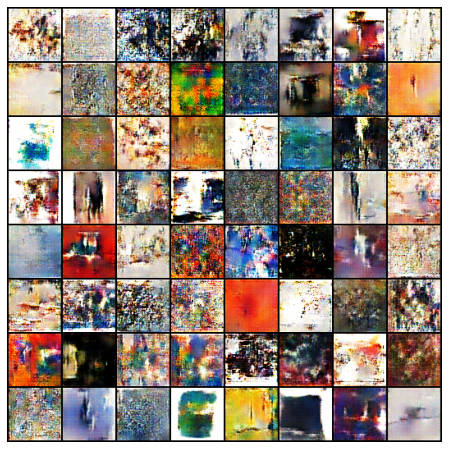

In [51]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=250, repeat_delay=250, blit=True)

HTML(ani.to_jshtml())